**INTRODUCTION**

The dataset comprises of 2,114 observations related to heart diseases with 3 classes of patients under normal, suspect, and pathological condition. Within such a setting, normal condition is treated as an inliner, while suspect and pathological are outliers. The task is to detect outliers using supervised and unsupervised models.

In [67]:
import numpy as np
import pandas as pd

from scipy.stats import boxcox
from scipy.stats import yeojohnson
from scipy.stats import chi2

from scipy.spatial.distance import pdist, mahalanobis, squareform

import itertools

from sklearn.datasets import load_wine

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from tqdm.notebook import tqdm as tqdm

from sklearn.metrics import classification_report, silhouette_score, calinski_harabasz_score

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.model_selection import  train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.ensemble import IsolationForest

from sklearn.covariance import EmpiricalCovariance, MinCovDet

from sklearn.svm import OneClassSVM

import seaborn as sns
import matplotlib.pyplot as plt

**FUNCTIONS AND COMMONLY USED CONSTANTS**

In [2]:
def report(y_data, predictions, outlier_label =-1):
  predictions = predictions.copy()

  predictions[predictions != outlier_label] = 0
  predictions[predictions == outlier_label] = 1


  print(classification_report(y_data, predictions))

**DATASET PREPARATION**

In [3]:
df = pd.read_csv(r'C:\Users\1\Desktop\HW\Cardiotocography.csv')

In [4]:
df.head()

,id,LB,AC,FM,UC,ASTV,MSTV,ALTV,MLTV,DL,...,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,outlier
0,1881.0,0.592593,0.000000,0.000000,0.294118,0.633803,0.338235,0.000000,0.013807,0.500000,...,0.045872,0.336207,0.333333,0.1,0.485149,0.247423,0.284091,0.638418,1.0,b'yes'
1,421.0,0.574074,0.038462,0.000000,0.000000,0.816901,0.029412,0.527473,0.092702,0.000000,...,0.770642,0.672414,0.166667,0.0,0.534653,0.587629,0.511364,0.016949,0.0,b'yes'
2,92.0,0.777778,0.000000,0.000000,0.000000,0.774648,0.029412,0.736264,0.096647,0.000000,...,0.816514,0.275862,0.222222,0.0,0.633663,0.659794,0.602273,0.000000,1.0,b'yes'
3,1767.0,0.259259,0.000000,0.000000,0.294118,0.704225,0.191176,0.000000,0.183432,0.428571,...,0.174312,0.275862,0.222222,0.1,0.000000,0.164948,0.000000,0.361582,0.0,b'yes'
4,1880.0,0.592593,0.000000,0.001773,0.294118,0.633803,0.352941,0.000000,0.013807,0.428571,...,0.045872,0.336207,0.333333,0.1,0.485149,0.226804,0.272727,0.683616,1.0,b'yes'


In [5]:
df.shape

(16880, 23)

Dataset: 
- 16,880 observations
- 21 numerical predictors 
- 1 id feature
- 1 binary target variable 

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16880 entries, 0 to 16879
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        16880 non-null  float64
 1   LB        16880 non-null  float64
 2   AC        16880 non-null  float64
 3   FM        16880 non-null  float64
 4   UC        16880 non-null  float64
 5   ASTV      16880 non-null  float64
 6   MSTV      16880 non-null  float64
 7   ALTV      16880 non-null  float64
 8   MLTV      16880 non-null  float64
 9   DL        16880 non-null  float64
 10  DS        16880 non-null  float64
 11  DP        16880 non-null  float64
 12  Width     16880 non-null  float64
 13  Min       16880 non-null  float64
 14  Max       16880 non-null  float64
 15  Nmax      16880 non-null  float64
 16  Nzeros    16880 non-null  float64
 17  Mode      16880 non-null  float64
 18  Mean      16880 non-null  float64
 19  Median    16880 non-null  float64
 20  Variance  16880 non-null  fl

The predictors are numerical and seem to be scaled from 0 to 1 (except for ID). Meanwhile the target var `outlier` is binary categorical and needs to be encoded.

In [7]:
df.outlier = df.outlier.map(dict({"b'yes'": 1,"b'no'": 0}))

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,16880.0,1123.872156,593.610901,1.0,641.000000,1150.500000,1619.000000,2126.0
LB,16880.0,0.483186,0.175738,0.0,0.351852,0.481481,0.592593,1.0
AC,16880.0,0.129270,0.143077,0.0,0.000000,0.076923,0.192308,1.0
FM,16880.0,0.011411,0.060514,0.0,0.000000,0.000000,0.003546,1.0
UC,16880.0,0.226668,0.156665,0.0,0.117647,0.235294,0.304348,1.0
ASTV,16880.0,0.425672,0.216970,0.0,0.236111,0.408451,0.608108,1.0
MSTV,16880.0,0.179521,0.121198,0.0,0.088235,0.161765,0.220588,1.0
ALTV,16880.0,0.064739,0.146732,0.0,0.000000,0.000000,0.050633,1.0
MLTV,16880.0,0.170819,0.114551,0.0,0.094675,0.155819,0.226824,1.0
DL,16880.0,0.113227,0.171935,0.0,0.000000,0.000000,0.214286,1.0


In [9]:
len(df.drop_duplicates())

16880

No duplicates in the dataset.

In [10]:
target = 'outlier'

features = list(df.columns)
features.remove(target)
features.remove('id')

features

['LB',
 'AC',
 'FM',
 'UC',
 'ASTV',
 'MSTV',
 'ALTV',
 'MLTV',
 'DL',
 'DS',
 'DP',
 'Width',
 'Min',
 'Max',
 'Nmax',
 'Nzeros',
 'Mode',
 'Mean',
 'Median',
 'Variance',
 'Tendency']

**EDA**

In [11]:
df[target].value_counts()

0    16550
1      330
Name: outlier, dtype: int64

Approx. 2% of the data are outliers.

Using the Tuckey rule, we can already see that some of the outliers in the context of separate features.

<ipython-input-12-af579fa0fb58>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


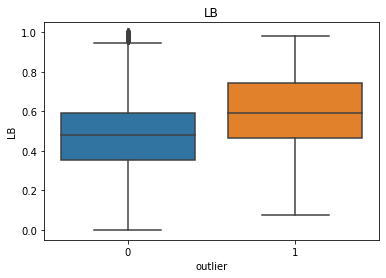

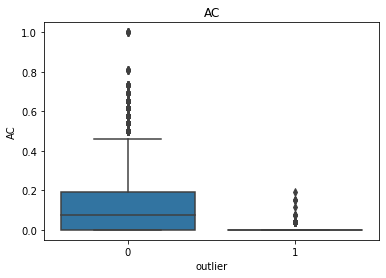

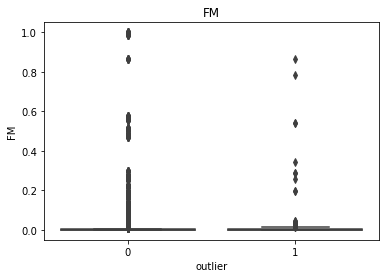

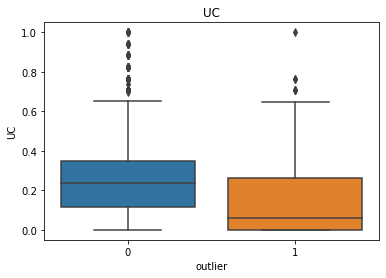

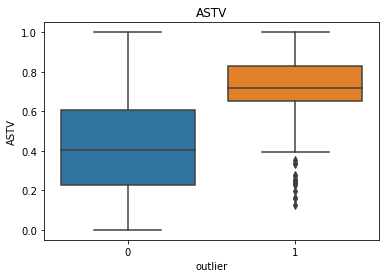

...

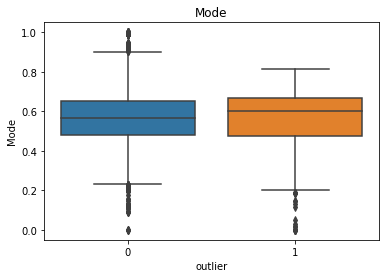

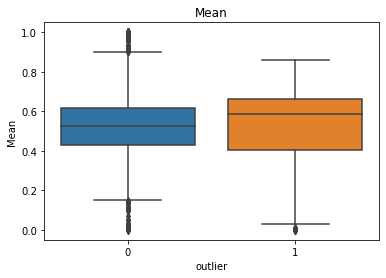

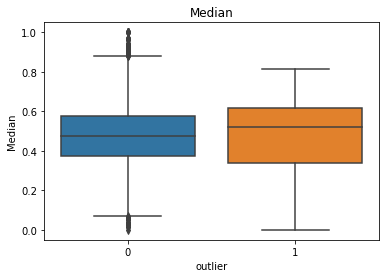

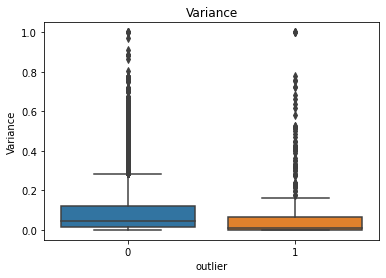

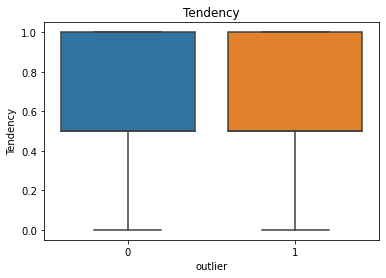

In [12]:
for feature in features:    
    plt.figure()
    sns.boxplot(y = feature, x=target, data=df, )
    plt.title(feature)

A possible approach to outlier detection would be to mark all the observations that lie beyond the whiskers. However, this is not the focus of the work.

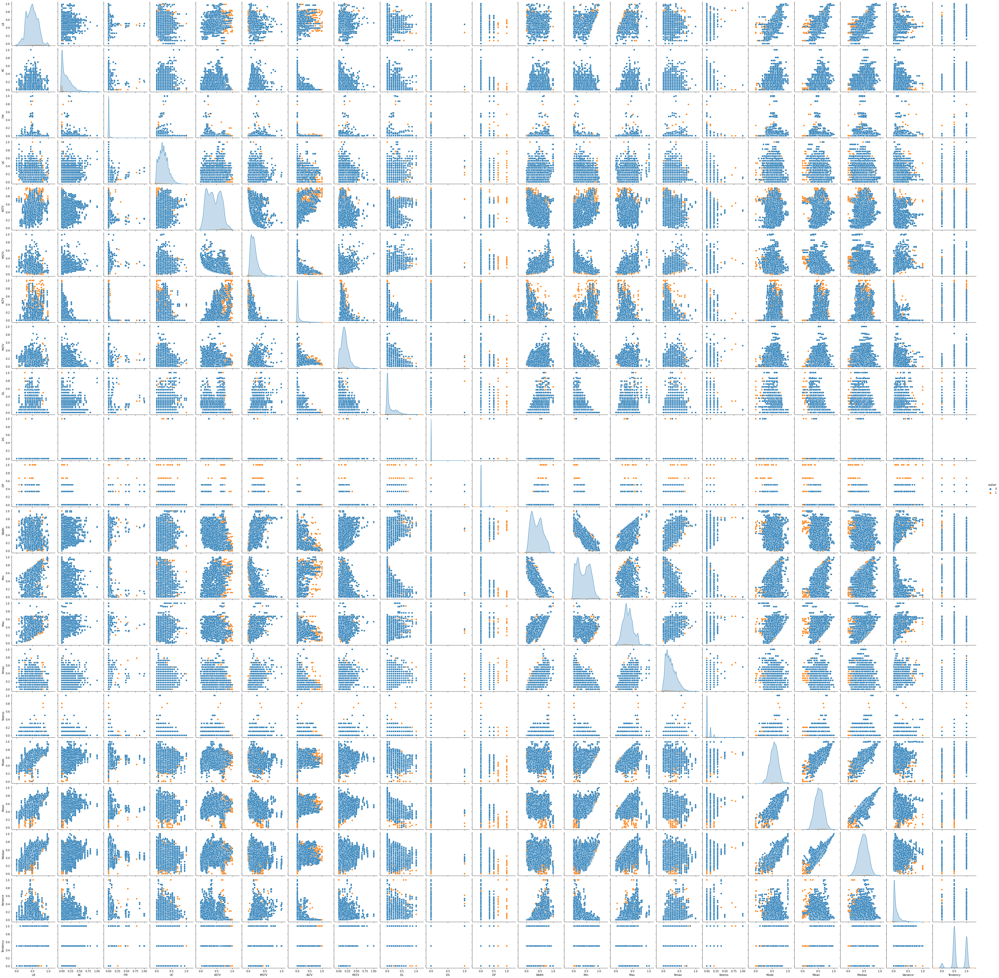

In [12]:
sns.pairplot(df[features + [target]], hue=target)

- `DP` is a clear indicator to outliers with a distinct border
- In general, outliers seem to be more or less separable from the inliers in the shown pair-plots

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


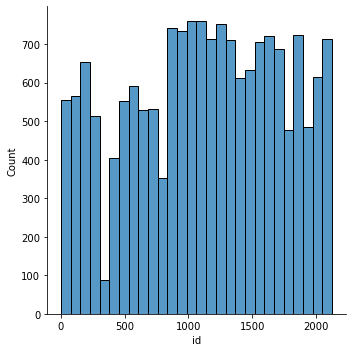

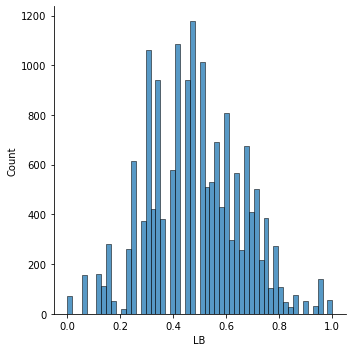

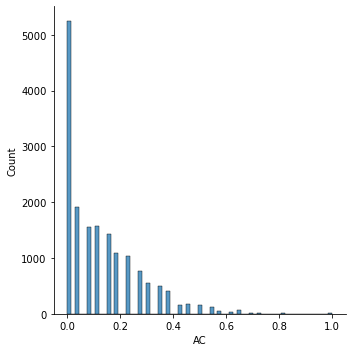

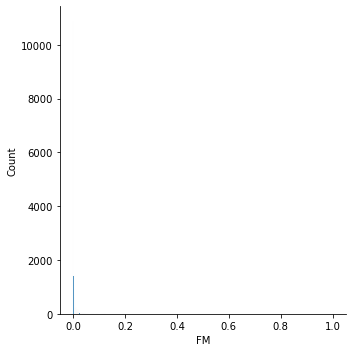

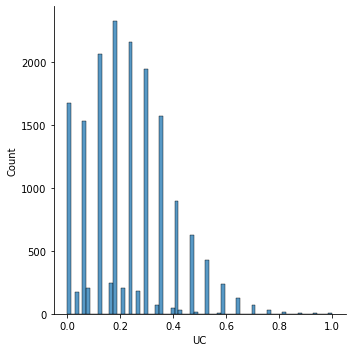

...

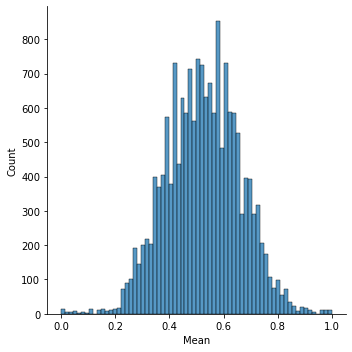

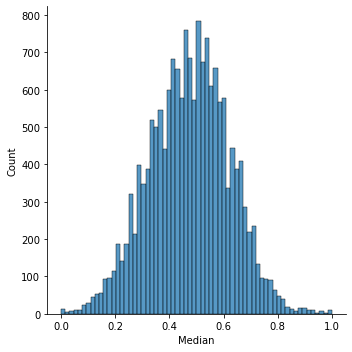

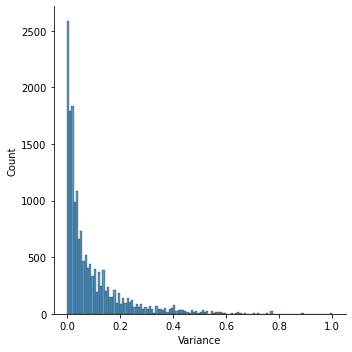

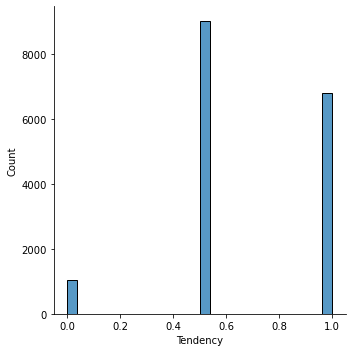

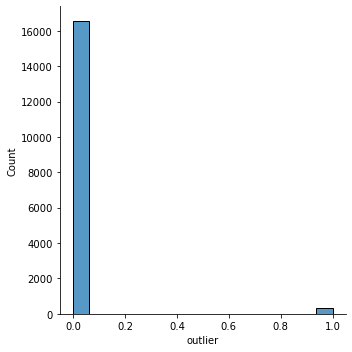

In [13]:
for i in df.columns:
    sns.displot(df[i])

- Some of the predictors should be normalized 
- The dataset is imbalanced in relation to the target variable which justifies the approach to apply anomaly detection algorithms

In [14]:
SKEWED = ['AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'DL', 
          'DS', 'DP', 'Width', 'Min', 'Max', 'Nmax', 'Nzeros',
         'Mode', 'Variance']
NOT_SKEWED = [col for col in features if col not in SKEWED]

A separate DF for transformed features:

In [15]:
X_tr = pd.DataFrame()

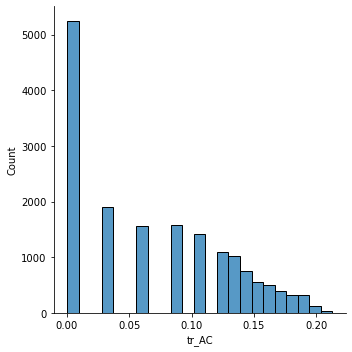

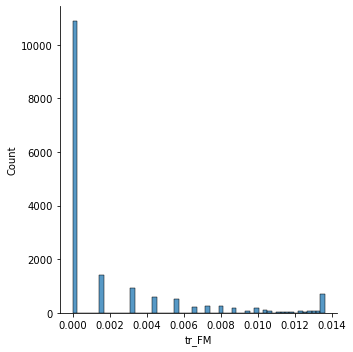

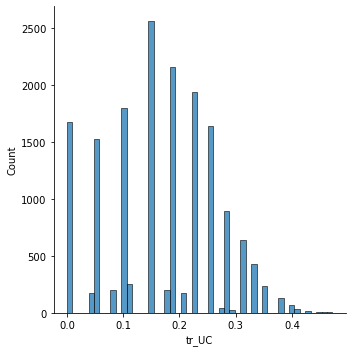

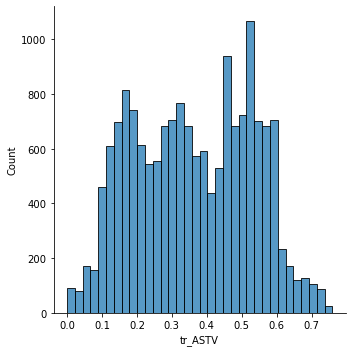

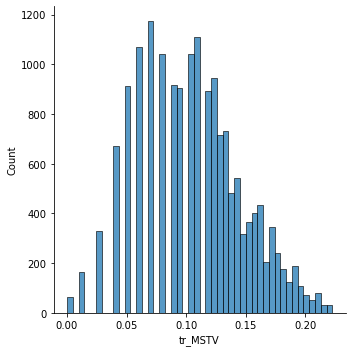

...

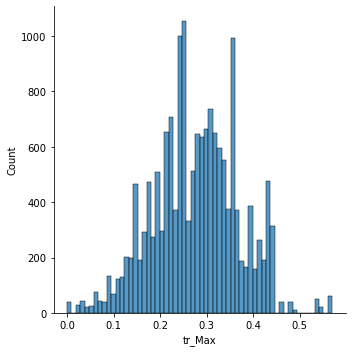

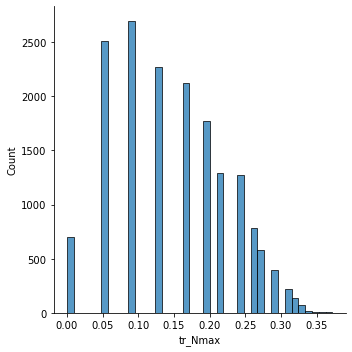

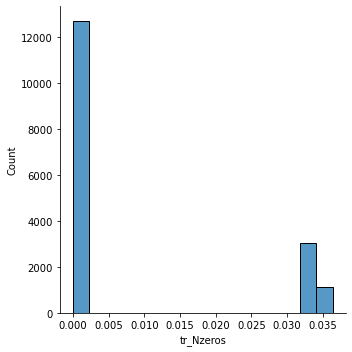

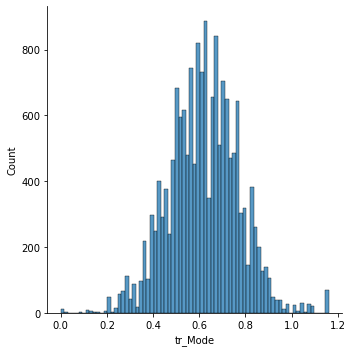

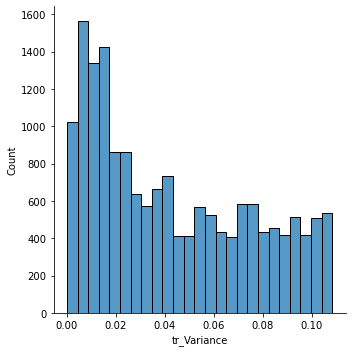

In [16]:
for col in SKEWED:
    X_tr['tr_{}'.format(col)], lam = yeojohnson(df[col])
    sns.displot(X_tr['tr_{}'.format(col)])

As a result of the transformation, only some of the features' distributions got closer to Gaussian. This might result in poor performance of some algorithms like Mahalanobis distance.

In [17]:
for col in NOT_SKEWED:
    X_tr[col] = df[col]

In [18]:
X_tr.head()

,tr_AC,tr_FM,tr_UC,tr_ASTV,tr_MSTV,tr_ALTV,tr_MLTV,tr_DL,tr_DS,tr_DP,...,tr_Min,tr_Max,tr_Nmax,tr_Nzeros,tr_Mode,tr_Variance,LB,Mean,Median,Tendency
0,-0.000000,-0.000000,0.221995,0.523426,0.166953,-0.000000,0.013473,0.134325,-0.0,-0.000000,...,0.045065,0.266660,0.217864,0.033723,0.525861,0.107439,0.592593,0.247423,0.284091,1.0
1,0.034717,-0.000000,-0.000000,0.645694,0.027270,0.069416,0.079276,-0.000000,-0.0,-0.000000,...,0.607445,0.444305,0.132351,-0.000000,0.583708,0.015571,0.574074,0.587629,0.511364,0.0
2,-0.000000,-0.000000,-0.000000,0.618319,0.027270,0.069549,0.082132,-0.000000,-0.0,-0.000000,...,0.636400,0.227105,0.164807,-0.000000,0.701517,-0.000000,0.777778,0.659794,0.602273,1.0
3,-0.000000,-0.000000,0.221995,0.571599,0.123361,-0.000000,0.136695,0.130935,-0.0,0.014545,...,0.163455,0.227105,0.164807,0.033723,0.000000,0.102261,0.259259,0.164948,0.000000,0.0
4,-0.000000,0.001661,0.221995,0.523426,0.170043,-0.000000,0.013473,0.130935,-0.0,0.014545,...,0.045065,0.266660,0.217864,0.033723,0.525861,0.107694,0.592593,0.226804,0.272727,1.0


**Dimensionality Reduction**

Reducing dimensionality for visualisation.

In [19]:
scaler = StandardScaler()

In [20]:
X_scaled = scaler.fit_transform(X_tr)

In [21]:
pca = PCA(n_components=2)

In [22]:
X_2d = pca.fit_transform(X_scaled)

In [23]:
df['pca_x'], df['pca_y'] = X_2d[:, 0], X_2d[:, 1]

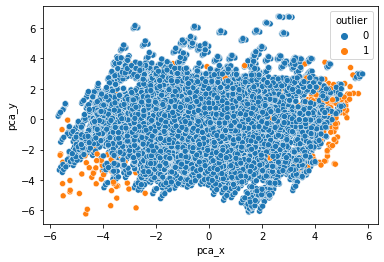

In [24]:
fig = sns.scatterplot(data=df, x='pca_x', y='pca_y', hue=target)

**Mahalanobis rule**

In [25]:
X_scaled = pd.DataFrame(X_scaled)

In [26]:
covariance_inverse = np.linalg.inv(np.cov(X_scaled.T))

In [27]:
mean_vector = X_scaled.mean(axis=0)

df['bias_distance'] = X_scaled.apply(lambda row:
                             mahalanobis(mean_vector, row, VI=covariance_inverse), 
                             axis=1)

Text(0.5, 0.98, 'Mahalanobis distances distribution')

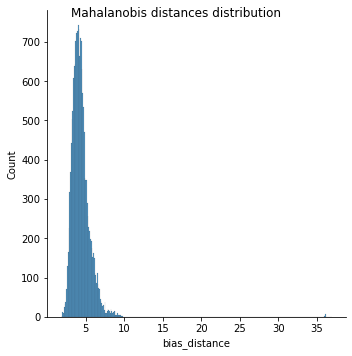

In [75]:
ax = sns.displot(df['bias_distance'])
ax.fig.suptitle("Mahalanobis distances distribution")

Looking at the distribution of Mahalanobis distances, we can take the threshold value of 7 to cut-off outliers.

In [29]:
df['predictions_md'] = 0
df['predictions_md'][df['bias_distance'] > 7] = -1

<ipython-input-29-e6e70041b2bd>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['predictions_md'][df['bias_distance'] > 7] = -1


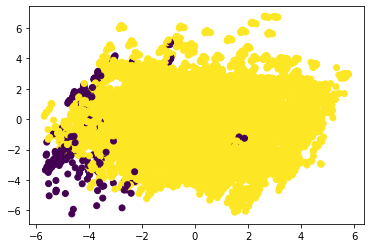

In [78]:
ax = plt.scatter(df['pca_x'], df['pca_y'], c=df['predictions_md'])

In [71]:
report(df[target], df.predictions_md)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     16550
           1       0.14      0.18      0.16       330

    accuracy                           0.96     16880
   macro avg       0.56      0.58      0.57     16880
weighted avg       0.97      0.96      0.97     16880



It can be said that Mahalanobis rule worked out somewhat poorly for this dataset. Most likely this is due to not normal distribution of the features even after transformations. Other types of transformations might improve the scores.

**SUPERVISED MODELS**

**1) SVM**

In [32]:
df_scaled = pd.DataFrame
df_scaled = X_scaled
df_scaled[target] = df[target]
df_scaled.head()

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,outlier
0,-1.161207,-0.569333,0.556472,0.965273,1.382413,-0.642833,-1.759015,1.689660,-0.027762,-0.216083,...,-0.109909,0.796275,1.698782,-0.624160,1.980982,0.622570,-2.039105,-1.301182,1.115338,1
1,-0.606834,-0.569333,-1.729590,1.696192,-1.862230,2.050279,-0.666274,-0.821388,-0.027762,-0.216083,...,1.815831,-0.267519,-0.572958,-0.242933,-0.839734,0.517192,0.455612,0.247145,-2.272625,1
2,-1.161207,-0.569333,-1.729590,1.532542,-1.862230,2.055431,-0.618848,-0.821388,-0.027762,-0.216083,...,-0.538710,0.136241,-0.572958,0.533460,-1.317826,1.676357,0.984794,0.866476,1.115338,1
3,-1.161207,-0.569333,0.556472,1.253254,0.369815,-0.642833,0.287242,1.626291,-0.027762,4.627850,...,-0.538710,0.136241,1.698782,-4.089721,1.821978,-1.274245,-2.643885,-3.236591,-2.272625,1
4,-1.161207,-0.144026,0.556472,0.965273,1.454181,-0.642833,-1.759015,1.626291,-0.027762,4.627850,...,-0.109909,0.796275,1.698782,-0.624160,1.988817,0.622570,-2.190300,-1.378598,1.115338,1


Train/Test split for supervised models

In [33]:
X_train, X_test, y_train, y_test = train_test_split(df_scaled.drop(target,axis=1), df_scaled[target], 
                                                    test_size=0.2, stratify = df_scaled[target])

In [34]:
svm = svm.SVC()

In [35]:
svm.fit(X_train, y_train)

SVC()

In [36]:
svm_pred = svm.predict(X_test)

In [37]:
roc_auc_score(y_test, svm_pred)

0.7878787878787878

In [38]:
print(classification_report(y_test, svm_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3310
           1       1.00      0.58      0.73        66

    accuracy                           0.99      3376
   macro avg       1.00      0.79      0.86      3376
weighted avg       0.99      0.99      0.99      3376



**2) Logistic regression**

In [39]:
logreg = LogisticRegression()

In [40]:
logreg.fit(X_train, y_train)

LogisticRegression()

In [44]:
logreg_pred = logreg.predict(X_test)

In [45]:
roc_auc_score(y_test, logreg_pred)

0.6963654673624463

In [46]:
print(classification_report(y_test, logreg_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3310
           1       0.87      0.39      0.54        66

    accuracy                           0.99      3376
   macro avg       0.93      0.70      0.77      3376
weighted avg       0.99      0.99      0.98      3376



**3) KNN**

In [47]:
neigh = KNeighborsClassifier(n_neighbors=3)

In [50]:
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [51]:
neigh_pred = neigh.predict(X_test)

In [52]:
roc_auc_score(y_test, neigh_pred)

0.8409090909090908

In [53]:
print(classification_report(y_test, neigh_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3310
           1       1.00      0.68      0.81        66

    accuracy                           0.99      3376
   macro avg       1.00      0.84      0.90      3376
weighted avg       0.99      0.99      0.99      3376



**CONSLUSIONS**

**KNN** model seems to outperform **SVM** and **Logistic regression** according to the ROC-AUC and Precision/Recall/F2 metrics.

**UNSUPERVISED MODELS**

**1) One-class SVM**

In [54]:
one_svm = OneClassSVM()

In [55]:
one_svm.fit(X_scaled)

OneClassSVM()

In [56]:
one_svm_pred = one_svm.predict(X_scaled)

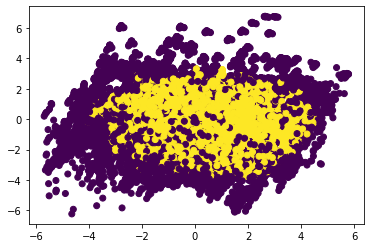

In [57]:
plt.scatter(df['pca_x'], df['pca_y'], c=one_svm_pred)

Huperparameters tuning

In [58]:
silhouette_score(X_scaled, one_svm_pred)

0.042351157839319385

In [59]:
calinski_harabasz_score(X_scaled, one_svm_pred)

271.4449734814181

In [68]:
adjusted_rand_score(df[target], one_svm_pred)

0.001250386577428036

**2) Isolation Forest**

In [61]:
iso_forest = IsolationForest()

In [62]:
iso_pred = iso_forest.fit_predict(X_scaled)

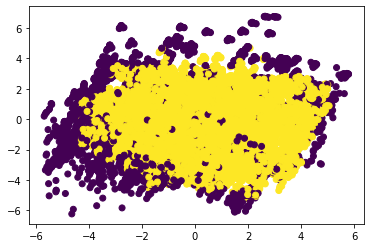

In [63]:
plt.scatter(df['pca_x'], df['pca_y'], c=iso_pred)

In [64]:
silhouette_score(X_scaled, iso_pred)

0.17781652314543717

In [65]:
calinski_harabasz_score(X_scaled, iso_pred)

498.38816533940695

In [69]:
adjusted_rand_score(df[target], iso_pred)

0.13252759262352726

In terms of unsupervised models, **Isolation Forest** seems to produce better metrics than **One Class SVM**. 